In [1]:
import _pickle
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
with open('model_ready_data', 'rb') as f:
    df = _pickle.load(f)
df.head()

,rent,latitude,longitude,oda_sayisi,salon_sayisi,brut_m2,net_m2,bina_yasi,kat_sayisi,esyali,...,binned_bulundugu_kat_cat_1,binned_bulundugu_kat_cat_10,binned_bulundugu_kat_cat_11,binned_bulundugu_kat_cat_2,binned_bulundugu_kat_cat_3,binned_bulundugu_kat_cat_4,binned_bulundugu_kat_cat_6,binned_bulundugu_kat_cat_7,binned_bulundugu_kat_cat_8,binned_bulundugu_kat_cat_9
8262,30000,41.043127,28.969064,2,1,100,75,1,8.0,True,...,0,0,1,0,0,0,0,0,0,0
8260,8000,40.979325,28.729905,3,1,145,130,30,5.0,False,...,0,0,1,0,0,0,0,0,0,0
7889,10000,41.057928,28.974291,3,1,110,100,15,5.0,False,...,0,0,1,0,0,0,0,0,0,0
7919,65000,41.152676,28.924586,3,1,165,121,0,3.0,False,...,0,0,0,0,0,1,0,0,0,0
7923,55000,41.207677,29.020296,6,2,450,430,16,4.0,False,...,0,1,0,0,0,0,0,0,0,0


In [48]:
numerical_cols = [col for col in df.columns if df[col].dtype in [np.float64, np.int32, np.int64]]
print(numerical_cols)

['rent', 'latitude', 'longitude', 'oda_sayisi', 'salon_sayisi', 'brut_m2', 'net_m2', 'bina_yasi', 'kat_sayisi', 'banyo_sayisi', 'cephe_sayisi', 'bulundugu_kat_num']


kira vs brut/net m2

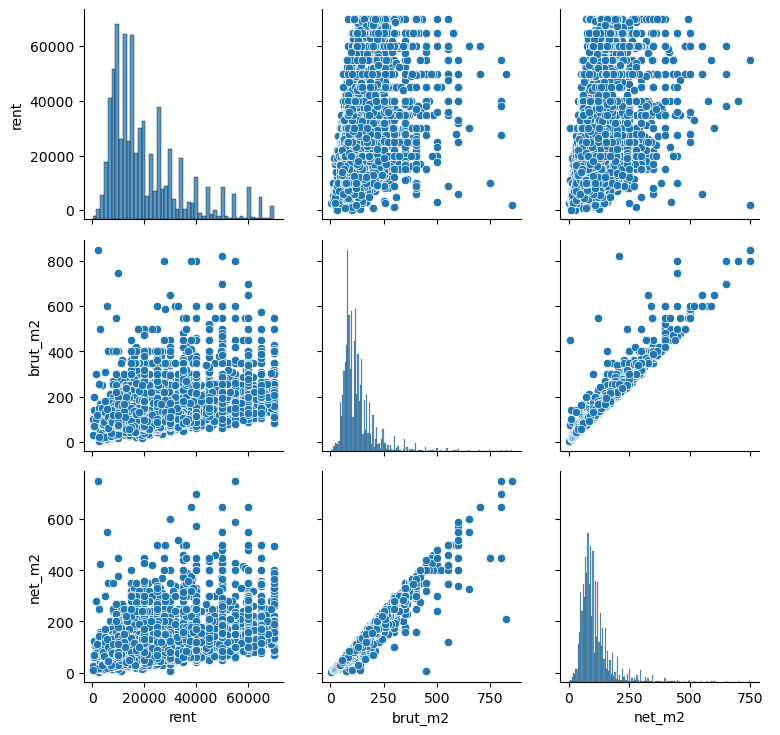

In [47]:
mask = df['brut_m2'] < 1000

g = sns.PairGrid(df[mask][['rent', 'brut_m2', 'net_m2']])
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
g.add_legend()
g.figure

kira vs. oda, salon, banyo sayısı

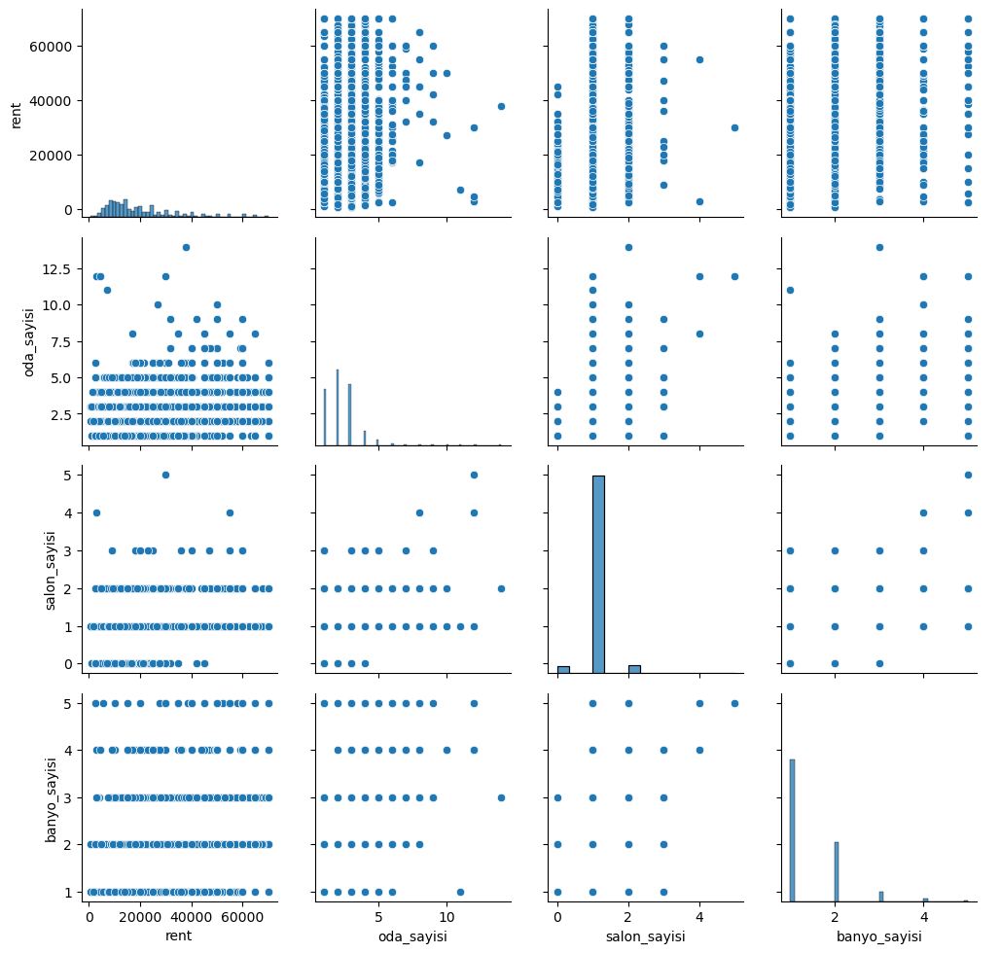

In [55]:
mask = ((df['oda_sayisi'] < 15) & (df['salon_sayisi'] < 10) & (df['banyo_sayisi'] < 6))

g = sns.PairGrid(df[mask][['rent', 'oda_sayisi', 'salon_sayisi', 'banyo_sayisi']])
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
g.add_legend()
g.figure

kira vs bina yaşı

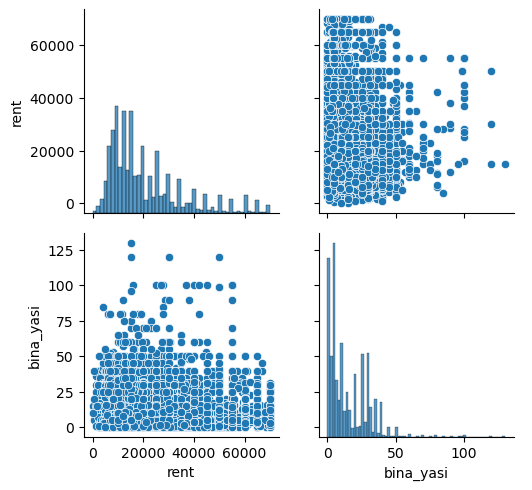

In [56]:
g = sns.PairGrid(df[['rent', 'bina_yasi']])
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
g.add_legend()
g.figure

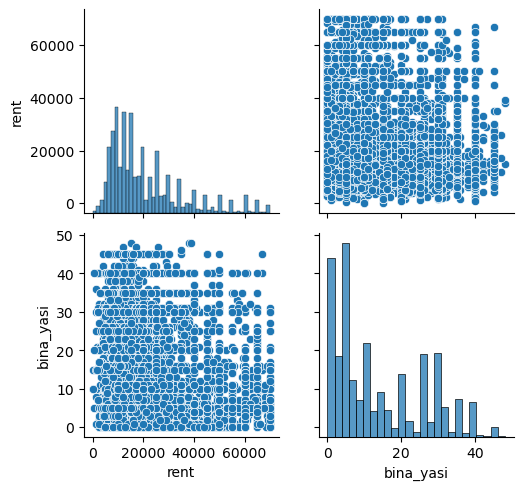

In [57]:
mask = df['bina_yasi'] < 50

g = sns.PairGrid(df[mask][['rent', 'bina_yasi']])
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
g.add_legend()
g.figure

kira vs. cephe sayısı

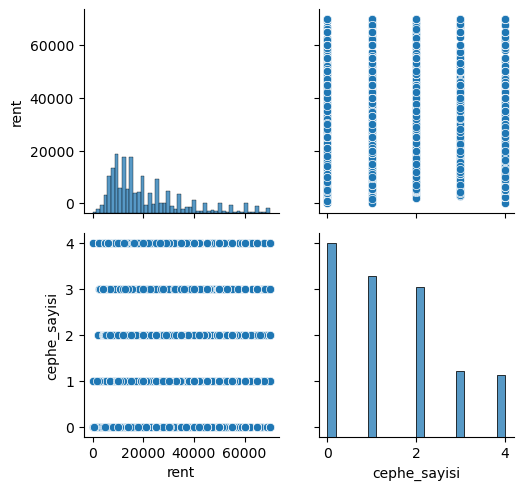

In [58]:
g = sns.PairGrid(df[['rent', 'cephe_sayisi']])
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
g.add_legend()
g.figure

kira vs. bulunduğu kat, kat sayısı

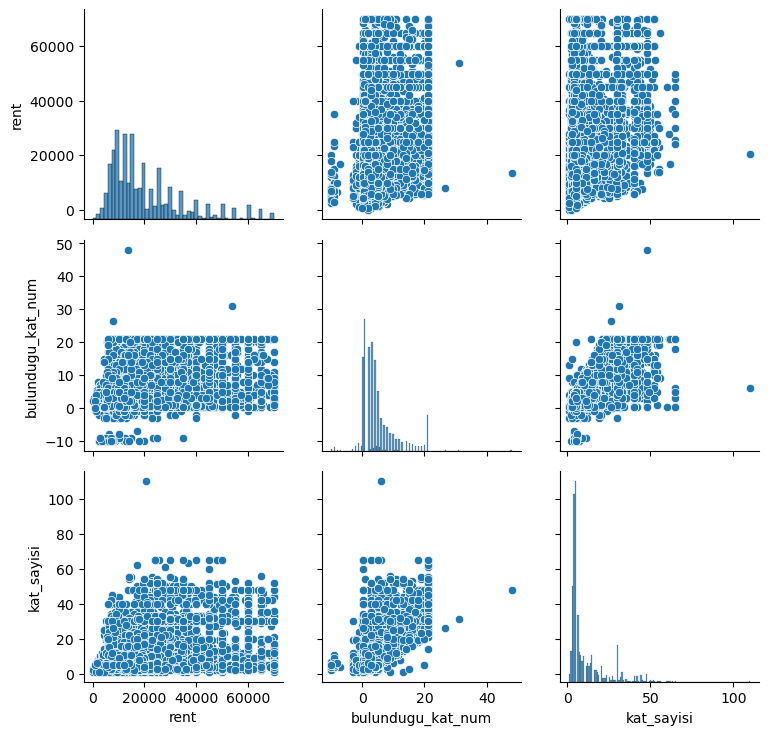

In [59]:
g = sns.PairGrid(df[['rent', 'bulundugu_kat_num', 'kat_sayisi']])
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
g.add_legend()
g.figure

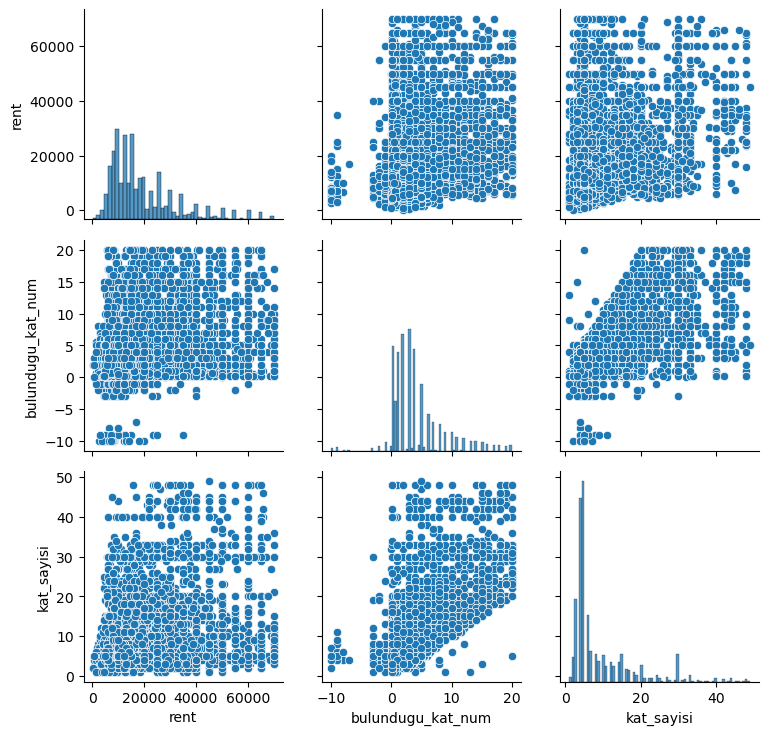

In [60]:
mask = (df['kat_sayisi'] < 50) & (df['bulundugu_kat_num'] < 21)

g = sns.PairGrid(df[mask][['rent', 'bulundugu_kat_num', 'kat_sayisi']])
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
g.add_legend()
g.figure

bulunduğu kat vs. cephe sayısı

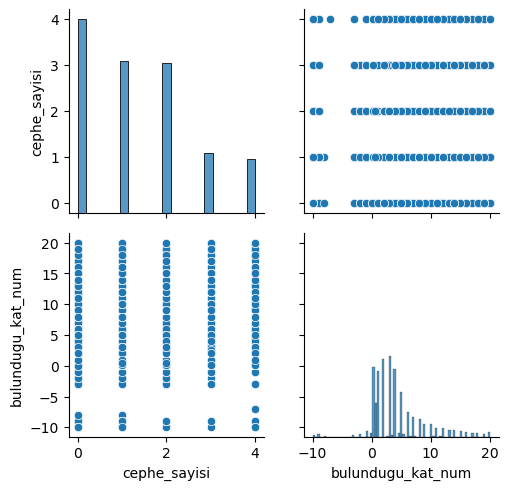

In [63]:
mask = (df['bulundugu_kat_num'] < 21)

g = sns.PairGrid(df[mask][['cephe_sayisi', 'bulundugu_kat_num']])
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
g.add_legend()
g.figure

In [69]:
df[(df['bulundugu_kat_num'] > 10) & (df['cephe_sayisi'] == 0)][['bulundugu_kat_num', 'cephe_sayisi']]

,bulundugu_kat_num,cephe_sayisi
2930,12.0,0
10458,13.0,0
10799,21.0,0
10919,16.0,0
10943,12.0,0
...,...,...
10370,19.0,0
9388,14.0,0
8156,14.0,0
10907,21.0,0


pairwise interactions between numerical columns

In [71]:
mask = ((df['brut_m2'] < 1000) & (df['oda_sayisi'] < 15) & (df['salon_sayisi'] < 10) & (df['banyo_sayisi'] < 6) 
        & (df['bina_yasi'] < 50) & (df['kat_sayisi'] < 50) & (df['bulundugu_kat_num'] < 21))

g = sns.PairGrid(df[mask][numerical_cols])
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
g.add_legend()

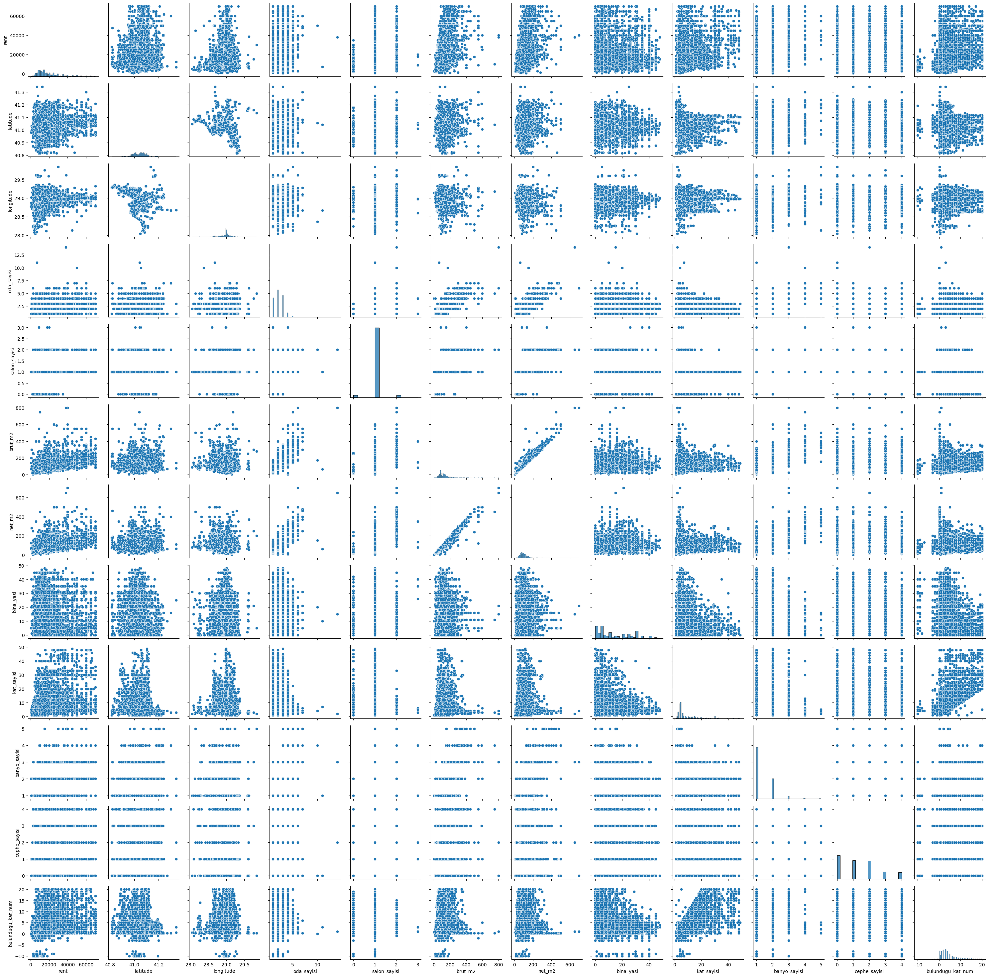

In [72]:
g.figure

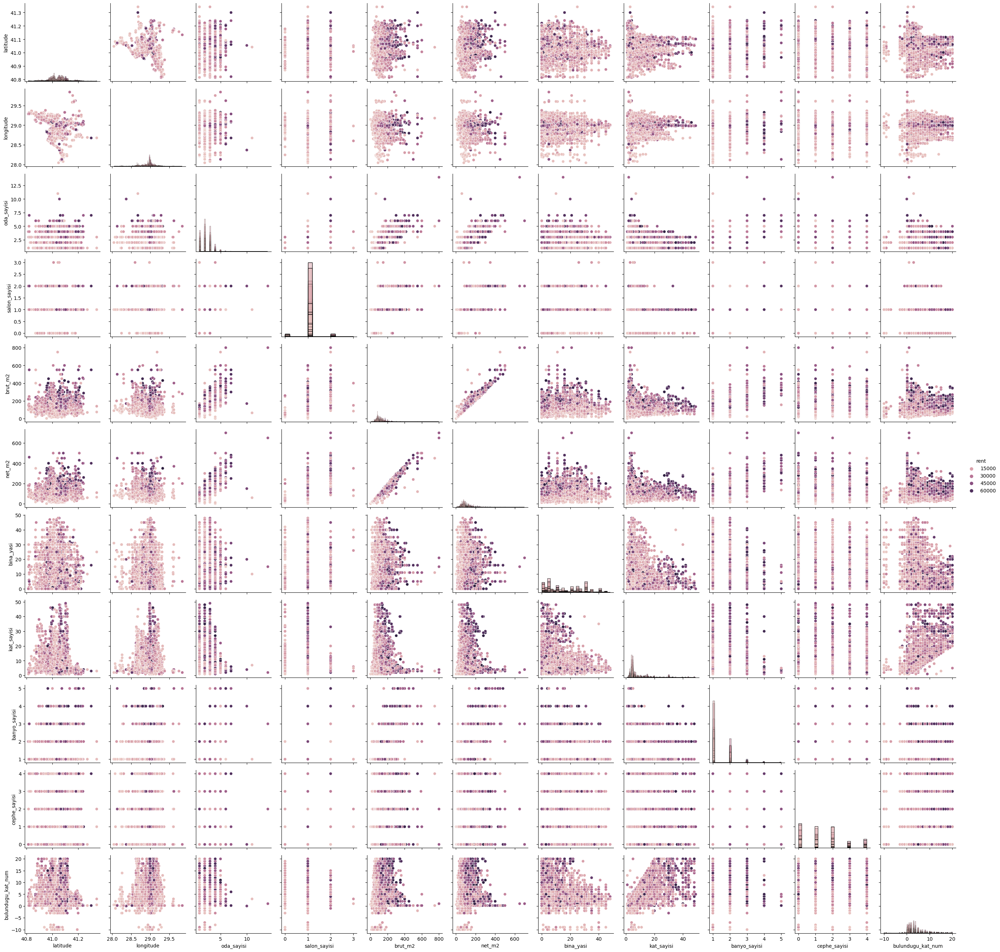

In [78]:
g = sns.PairGrid(df[mask][numerical_cols], hue="rent")
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
g.add_legend()
g.figure

In [79]:
df_interacted = df.copy()
df_interacted['INT_kat_sayisi_v_bina_yasi'] = df_interacted['kat_sayisi'] * df_interacted['bina_yasi']

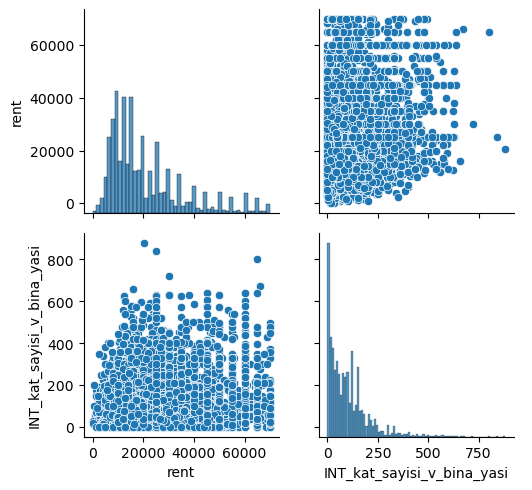

In [82]:
mask = df_interacted['INT_kat_sayisi_v_bina_yasi'] < 1000

g = sns.PairGrid(df_interacted[mask][['rent', 'INT_kat_sayisi_v_bina_yasi']])
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
g.add_legend()
g.figure

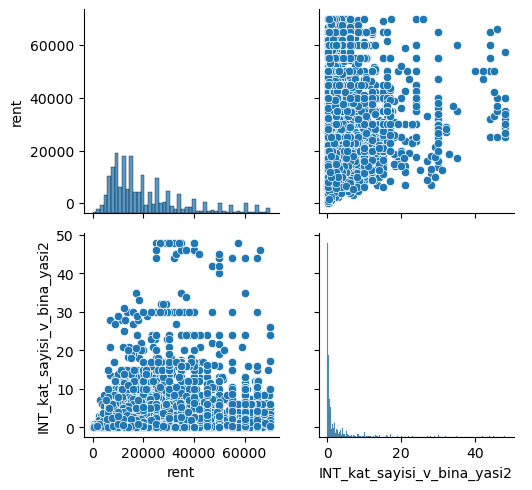

In [83]:
df_interacted['INT_kat_sayisi_v_bina_yasi2'] = df_interacted['kat_sayisi'] / df_interacted['bina_yasi']


g = sns.PairGrid(df_interacted[['rent', 'INT_kat_sayisi_v_bina_yasi2']])
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
g.add_legend()
g.figure

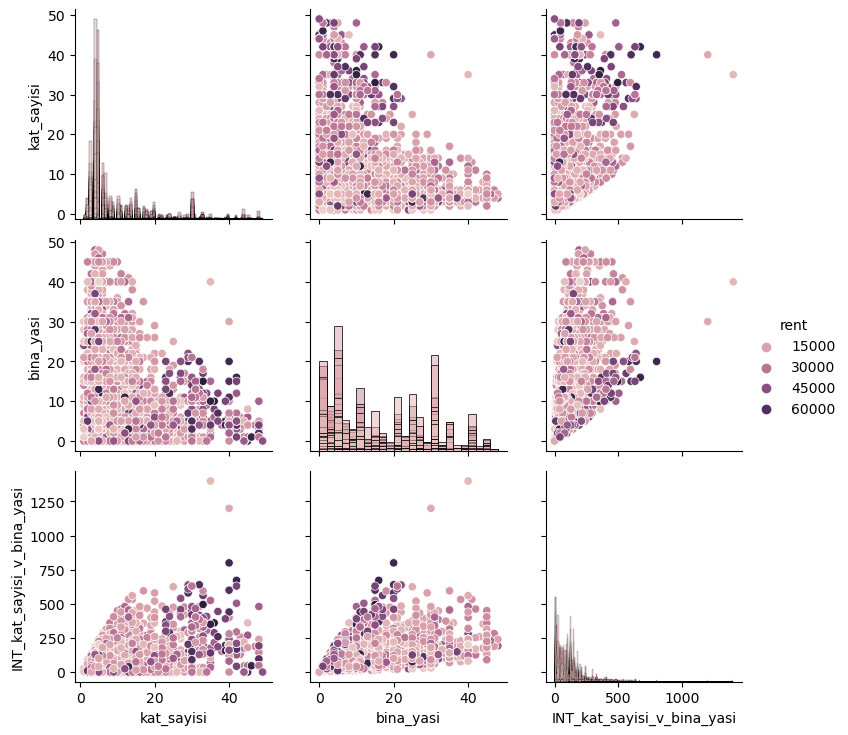

In [77]:
g = sns.PairGrid(df_interacted[mask][['rent', 'kat_sayisi', 'bina_yasi', 'INT_kat_sayisi_v_bina_yasi']], hue="rent")
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
g.add_legend()
g.figure

In [ ]:
######################

target distribution

In [87]:
df['rent_standardized'] = (df['rent'] - df['rent'].mean())/df['rent'].std()

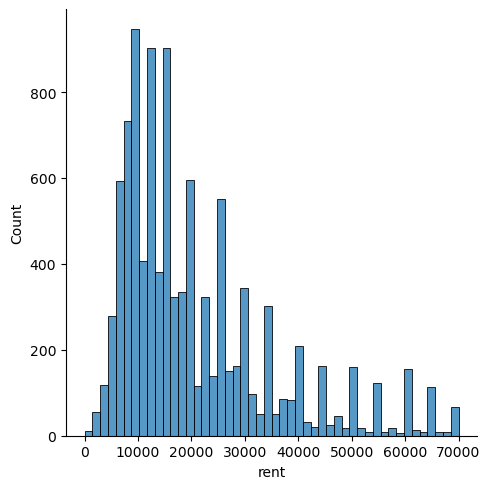

In [92]:
sns.displot(df['rent'])
plt.show()

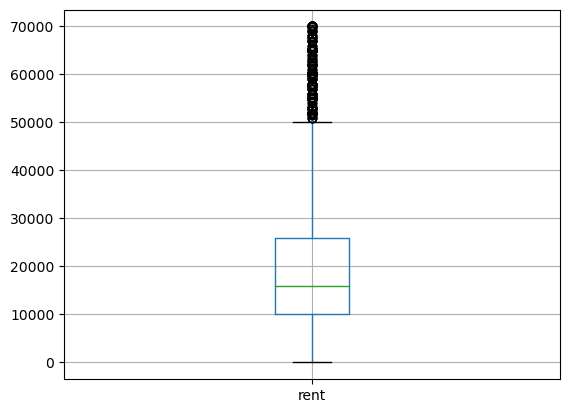

In [113]:
df.boxplot('rent')
plt.show()

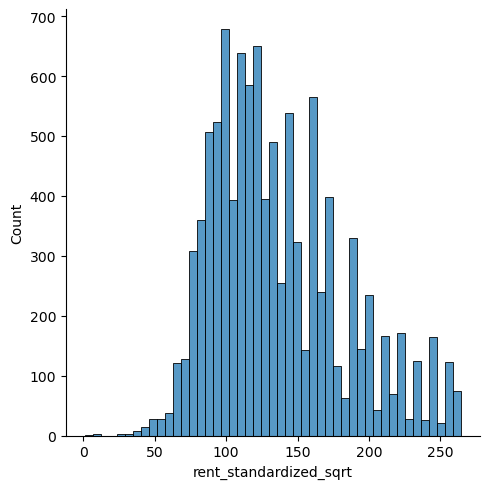

In [94]:
df['rent_standardized_sqrt'] = np.sqrt(df['rent'])
sns.displot(df['rent_standardized_sqrt'])
plt.show()

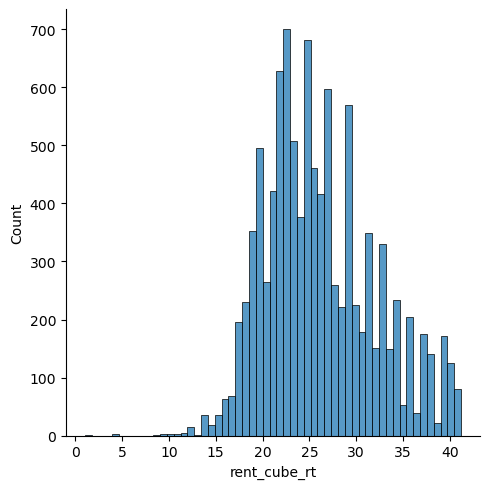

In [104]:
df['rent_cube_rt'] = np.power(df['rent'], 1/3)
sns.displot(df['rent_cube_rt'])
plt.show()

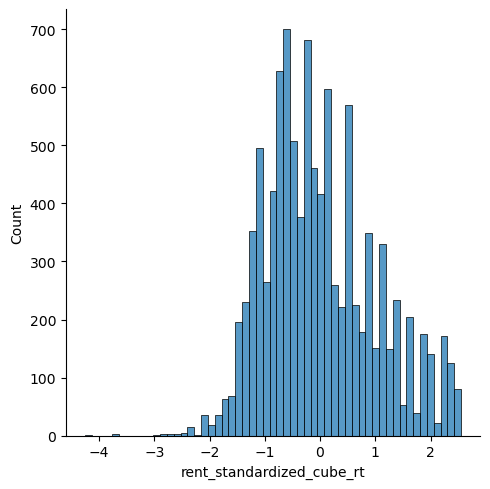

In [105]:
df['rent_standardized_cube_rt'] = (df['rent_cube_rt'] - df['rent_cube_rt'].mean())/df['rent_cube_rt'].std()
sns.displot(df['rent_standardized_cube_rt'])
plt.show()

In [110]:
df['rent_cube_rt'].describe() 

count    10255.000000
mean        26.134245
std          5.901339
min          1.000000
25%         21.544347
50%         25.198421
75%         29.624961
max         41.212853
Name: rent_cube_rt, dtype: float64

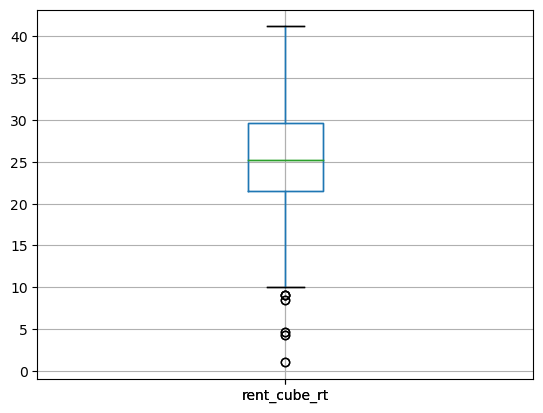

In [112]:
df.boxplot('rent_cube_rt')
plt.show()

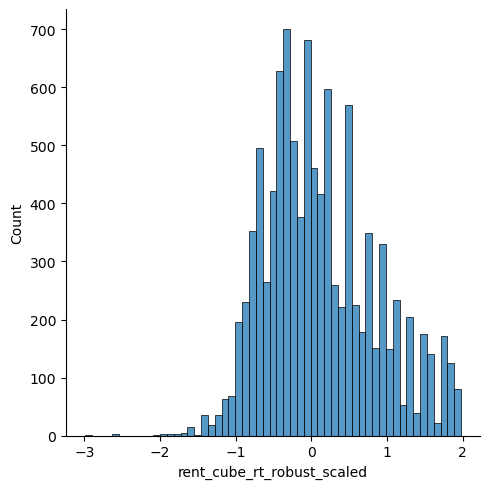

In [108]:
df['rent_cube_rt_robust_scaled'] = (df['rent_cube_rt'] - df['rent_cube_rt'].describe()['50%'])/(df['rent_cube_rt'].describe()['75%'] - df['rent_cube_rt'].describe()['25%'])
sns.displot(df['rent_cube_rt_robust_scaled'])
plt.show()

In [109]:
df['rent_cube_rt_robust_scaled'].describe()

count    10255.000000
mean         0.115811
std          0.730308
min         -2.994627
25%         -0.452203
50%          0.000000
75%          0.547797
max          1.981834
Name: rent_cube_rt_robust_scaled, dtype: float64

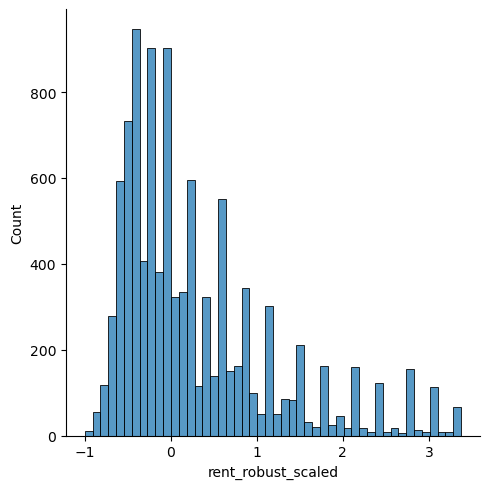

In [107]:
df['rent_robust_scaled'] = (df['rent'] - df['rent'].describe()['50%'])/(df['rent'].describe()['75%'] - df['rent'].describe()['25%'])
sns.displot(df['rent_robust_scaled'])
plt.show()

In [106]:
df['rent'].describe()

count    10255.000000
mean     20680.742467
std      14446.531105
min          1.000000
25%      10000.000000
50%      16000.000000
75%      26000.000000
max      70000.000000
Name: rent, dtype: float64

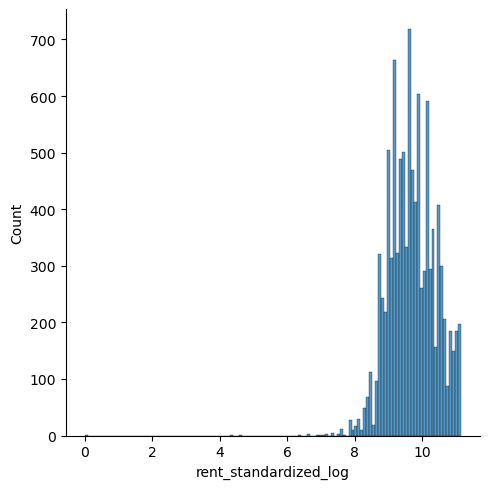

In [99]:
df['rent_standardized_log'] = np.log(df['rent'])
sns.displot(df['rent_standardized_log'])
plt.show()

to obtain better visualizations, let's continue with the most promising transformation: cube root

In [118]:
numerical_cols

['rent',
 'latitude',
 'longitude',
 'oda_sayisi',
 'salon_sayisi',
 'brut_m2',
 'net_m2',
 'bina_yasi',
 'kat_sayisi',
 'banyo_sayisi',
 'cephe_sayisi',
 'bulundugu_kat_num']

In [120]:
mask = ((df['brut_m2'] < 1000) & (df['oda_sayisi'] < 15) & (df['salon_sayisi'] < 10) & (df['banyo_sayisi'] < 6) 
        & (df['bina_yasi'] < 50) & (df['kat_sayisi'] < 50) & (df['bulundugu_kat_num'] < 21))

cols =['rent_cube_rt',
     'oda_sayisi',
     'salon_sayisi',
     'brut_m2',
     'net_m2',
     'bina_yasi',
     'kat_sayisi',
     'banyo_sayisi',
     'cephe_sayisi',
     'bulundugu_kat_num']

g = sns.PairGrid(df[mask][cols])
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
g.add_legend()

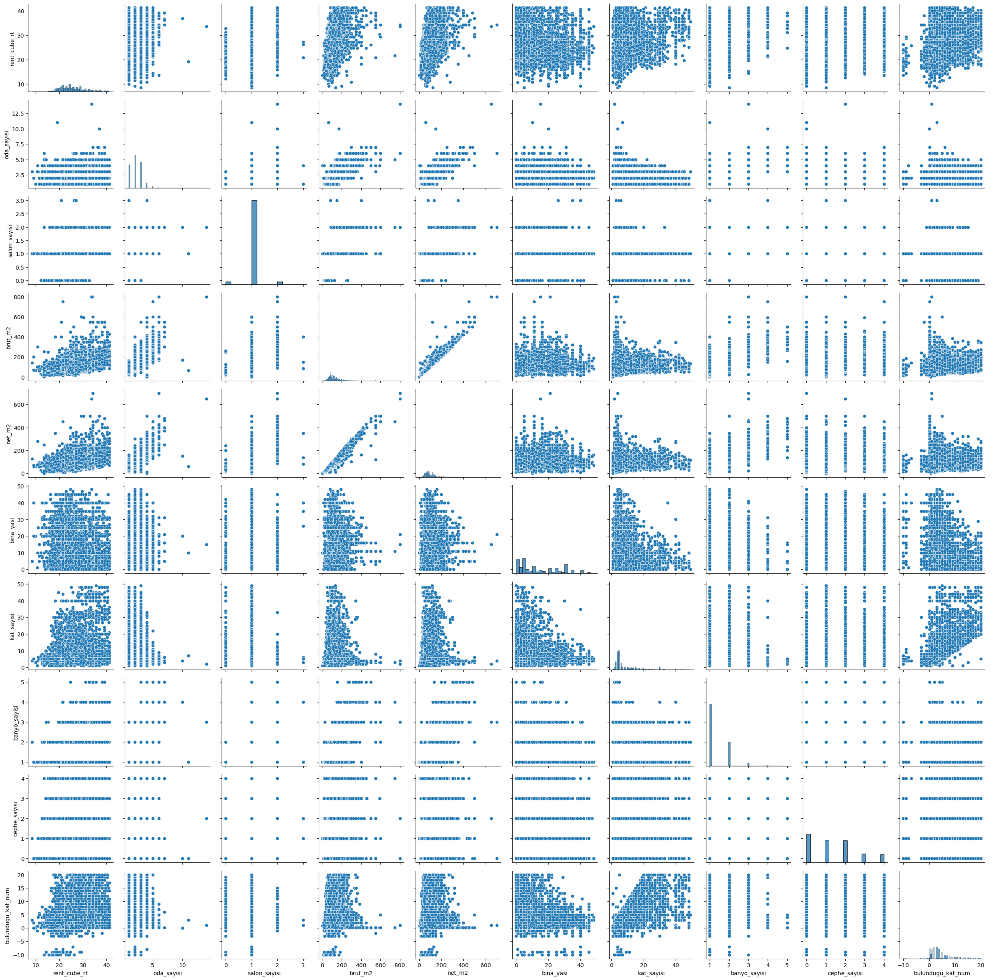

In [121]:
g.figure

rent_cube_rt vs m2

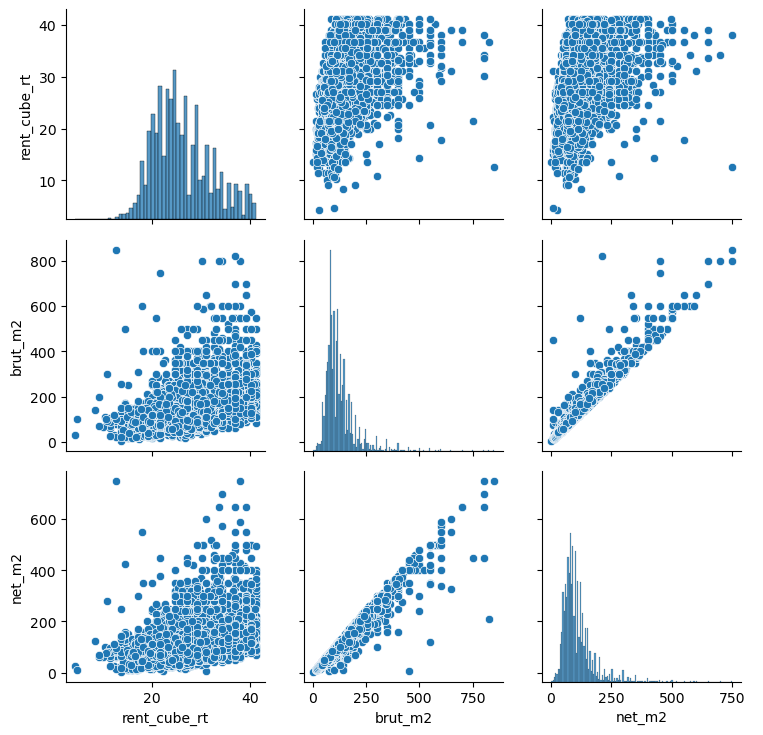

In [114]:
mask = df['brut_m2'] < 1000

g = sns.PairGrid(df[mask][['rent_cube_rt', 'brut_m2', 'net_m2']])
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
g.add_legend()
g.figure

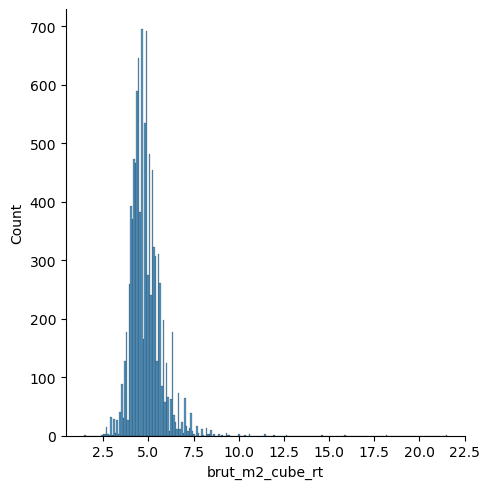

In [116]:
df['brut_m2_cube_rt'] = np.power(df['brut_m2'], 1/3)
sns.displot(df['brut_m2_cube_rt'])
plt.show()

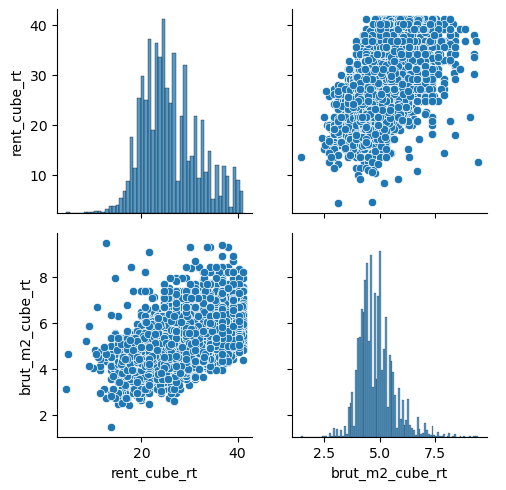

In [117]:
mask = df['brut_m2'] < 1000

g = sns.PairGrid(df[mask][['rent_cube_rt', 'brut_m2_cube_rt']])
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
g.add_legend()
g.figure

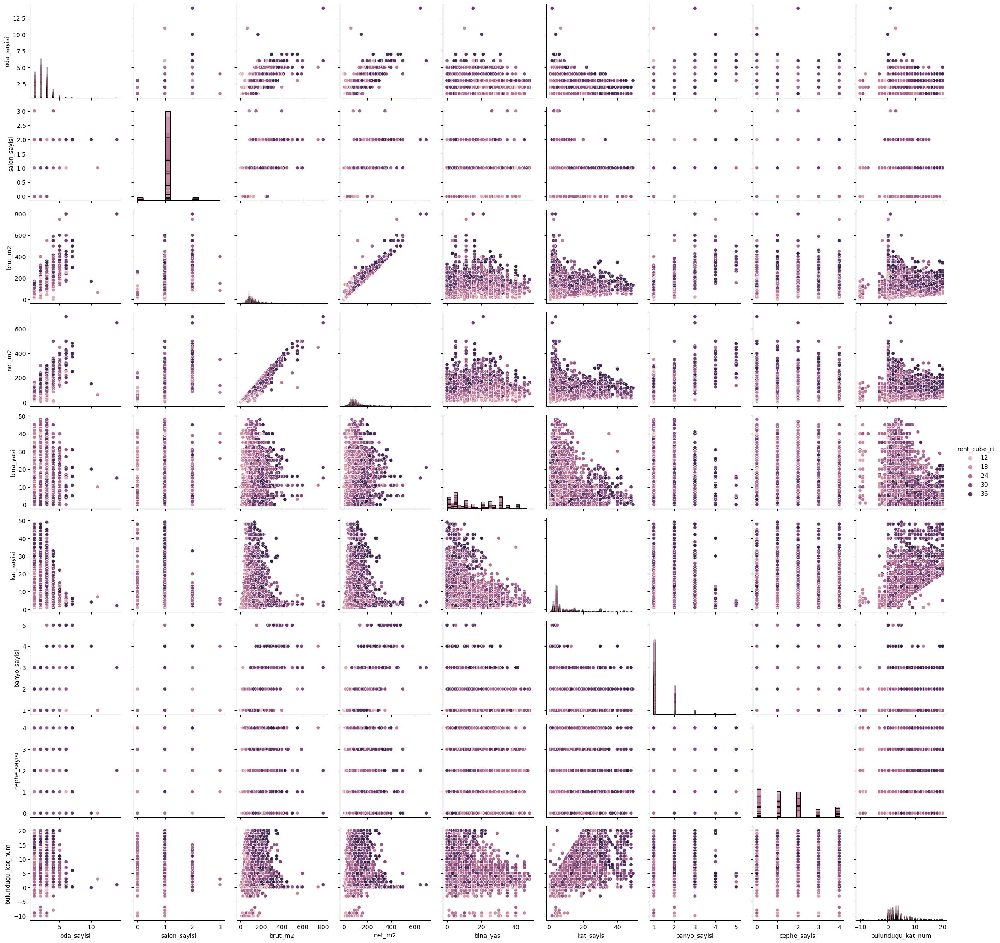

In [124]:
g = sns.PairGrid(df[mask][cols], hue="rent_cube_rt")
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
g.add_legend()
g.figure

There seems to be some tendency for both the cube root of the target and the target itself to increase as brut_m2 and net_m2 increase.

There is a cluster of low-rent observations where bulundugu_kat_num is low, as can be seen in the last row of the above grid

Root cube of target tends to be low when:
i. bina_yasi is high and oda_sayisi is low
ii. both kat_sayisi and oda_sayisi are low  
iii. kat_sayisi is low
iv. kat_sayisi is low and bina_yasi is high
v. 


<AxesSubplot:title={'center':'Pearson Correlation of Features'}>

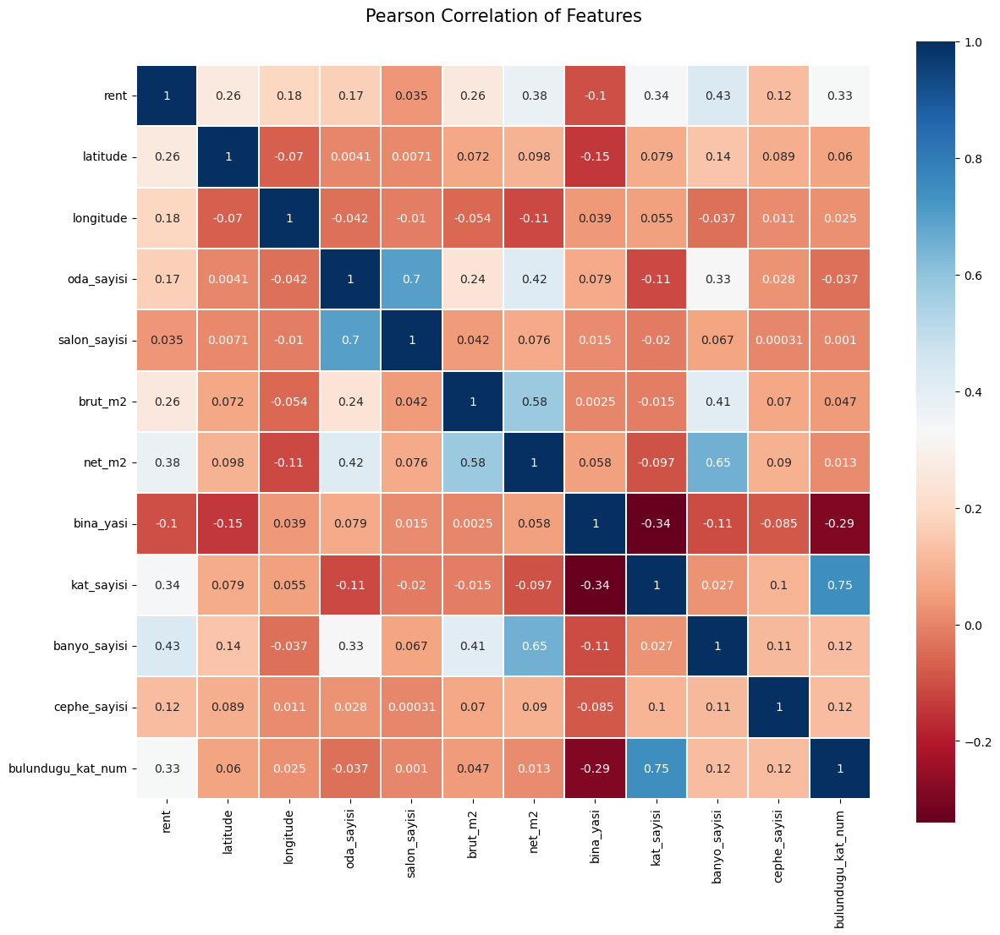

In [4]:
num_cols = ['rent',
         'latitude',
         'longitude',
         'oda_sayisi',
         'salon_sayisi',
         'brut_m2',
         'net_m2',
         'bina_yasi',
         'kat_sayisi',
         'banyo_sayisi',
         'cephe_sayisi',
         'bulundugu_kat_num']

colormap = plt.cm.RdBu
plt.figure(figsize=(14,12))
plt.title('Pearson Correlation of Features', y=1.05, size=15)
sns.heatmap(df[num_cols].astype(float).corr(),linewidths=0.1,vmax=1.0, 
            square=True, cmap=colormap, linecolor='white', annot=True)

i. no feature has high correlation with the target, which means there is no easy-to-extract relations between the features and the target.

ii. there are some high correlations between the features and this may be problematic as this would possibly mean separate features do not carry unique information about the target. these are salon_sayisi-oda_sayisi, net_m2-brut_m2, net_m2-banyo_sayisi, kat_sayisi-bulundugu_kat_num